# Test reading and plotting coefficients with pyEXP

We begin by importing `pyEXP` and friends and setting the working directory.

In [1]:
import os
import yaml
import pyEXP
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [12, 9]

# Move to the example data directory
#
os.chdir('../Data')

## Reading the cube coefficients
This is a test of the coefficients created by the `EXP-examples/Cube` run.

In [2]:
# Reread the coefs from the file.  These are new HDF5 coefficients sets.
#
coefs = pyEXP.coefs.Coefs.factory('outcoef.cube.run0')

print("Got coefs for name=", coefs.getName())

Got coefs for name= cube


## Now get the time vector and data tensor. Plot some coefficient series as a function of time.

In [3]:

times = coefs.Times()
data  = coefs.getAllCoefs()
nx, ny, nz, ntimes = data.shape
nmaxx = int((nx - 1)/2)
nmaxy = int((ny - 1)/2)
nmaxz = int((nz - 1)/2)

print("The data sizes and coefficient orders are:")
print(data.shape[0], data.shape[1], data.shape[2], nmaxx, nmaxy, nmaxz)

The data sizes and coefficient orders are:
13 13 13 6 6 6


### Finally, plot some coefficient values...

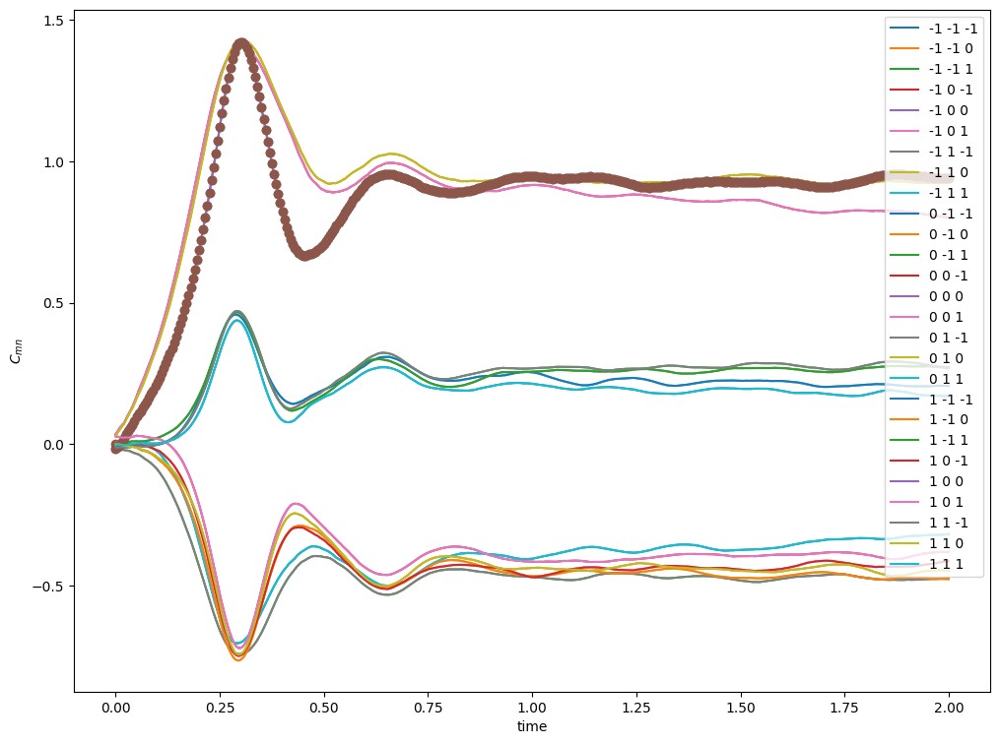

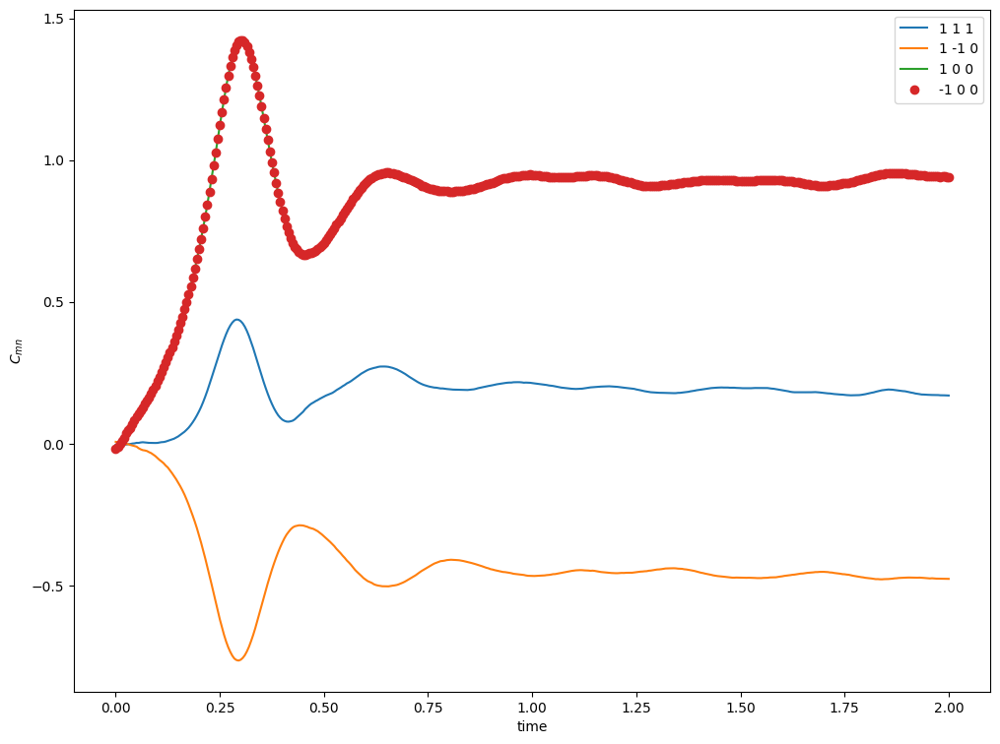

In [4]:
for i in range(nmaxx-1, nmaxx+2):
    for j in range(nmaxy-1, nmaxy+2):
        for k in range(nmaxz-1, nmaxz+2):
            plt.plot(times, np.real(data[i, j, k, :]), label='{} {} {}'.format(i-nmaxx, j-nmaxy, k-nmaxz))
            if j==nmaxy and k==nmaxz:
                plt.plot(times, np.real(data[i, j, k, :]), 'o')

plt.xlabel('time')
plt.ylabel(r'$C_{mn}$')
plt.legend()
plt.show()

plt.plot(times, np.real(data[nmaxx+1, nmaxy+1, nmaxz+1, :]), '-', label='{} {} {}'.format(1, 1, 1))
plt.plot(times, np.real(data[nmaxx+1, nmaxy-1, nmaxz, :]), '-', label='{} {} {}'.format(1, -1, 0))
plt.plot(times, np.real(data[nmaxx+1, nmaxy, nmaxz, :]), '-', label='{} {} {}'.format(1, 0, 0))
plt.plot(times, np.real(data[nmaxx-1, nmaxy, nmaxz, :]), 'o', label='{} {} {}'.format(-1, 0, 0))
plt.xlabel('time')
plt.ylabel(r'$C_{mn}$')
plt.legend()
plt.show()

## Try loading EXP config with pyYAML

In [5]:
with open('config.cube.yml', 'r') as f:
    yaml_db = yaml.load(f, Loader=yaml.FullLoader)

In [6]:
# There is only one component here at index = 0

config = yaml.dump(yaml_db['Components'][0]['force'])
        
print(config)

id: cube
parameters:
  nmaxx: 6
  nmaxy: 6
  nmaxz: 6



## Construct the cube basis

In [7]:
basis = pyEXP.basis.Basis.factory(config)

In [8]:
times = coefs.Times()

In [9]:
# Slice through the cube perpendicular to the z axis
rmin  = 0.0
rmax  = 1.0
pmin  = [ rmin, rmin, 0.5]
pmax  = [ rmax, rmax, 0.5]
grid  = [   40,    40,  0]

fields = pyEXP.field.FieldGenerator(times, pmin, pmax, grid)

surfaces = fields.slices(basis, coefs)

for v in surfaces:
    for k in surfaces[v]: print(v, k)

0.0 dens
0.0 dens m=0
0.0 dens m>0
0.0 potl
0.0 potl m=0
0.0 potl m>0
0.0 x force
0.0 y force
0.0 z force
0.005 dens
0.005 dens m=0
0.005 dens m>0
0.005 potl
0.005 potl m=0
0.005 potl m>0
0.005 x force
0.005 y force
0.005 z force
0.01 dens
0.01 dens m=0
0.01 dens m>0
0.01 potl
0.01 potl m=0
0.01 potl m>0
0.01 x force
0.01 y force
0.01 z force
0.015 dens
0.015 dens m=0
0.015 dens m>0
0.015 potl
0.015 potl m=0
0.015 potl m>0
0.015 x force
0.015 y force
0.015 z force
0.02 dens
0.02 dens m=0
0.02 dens m>0
0.02 potl
0.02 potl m=0
0.02 potl m>0
0.02 x force
0.02 y force
0.02 z force
0.025 dens
0.025 dens m=0
0.025 dens m>0
0.025 potl
0.025 potl m=0
0.025 potl m>0
0.025 x force
0.025 y force
0.025 z force
0.03 dens
0.03 dens m=0
0.03 dens m>0
0.03 potl
0.03 potl m=0
0.03 potl m>0
0.03 x force
0.03 y force
0.03 z force
0.035 dens
0.035 dens m=0
0.035 dens m>0
0.035 potl
0.035 potl m=0
0.035 potl m>0
0.035 x force
0.035 y force
0.035 z force
0.04 dens
0.04 dens m=0
0.04 dens m>0
0.04 potl
0.04 

## Slice through the cube perpendicular to the z axis and render

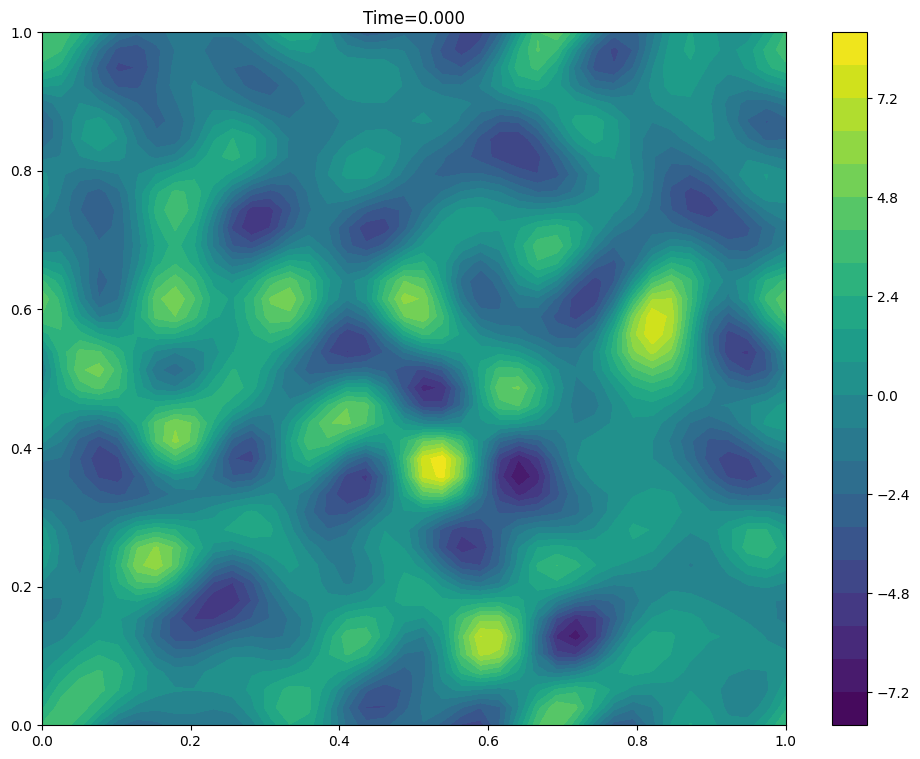

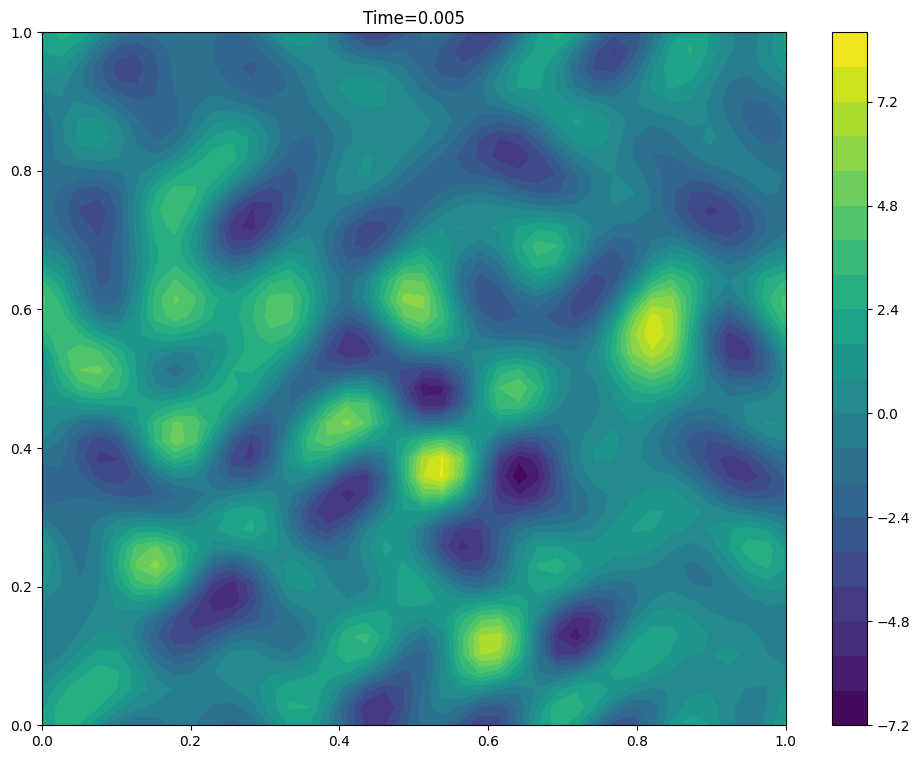

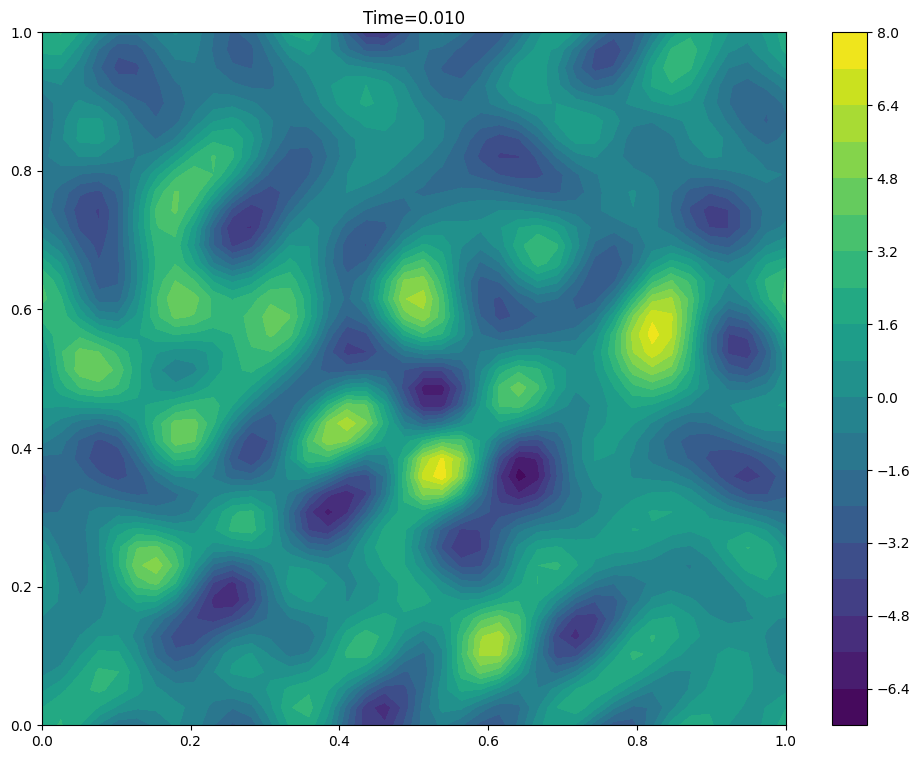

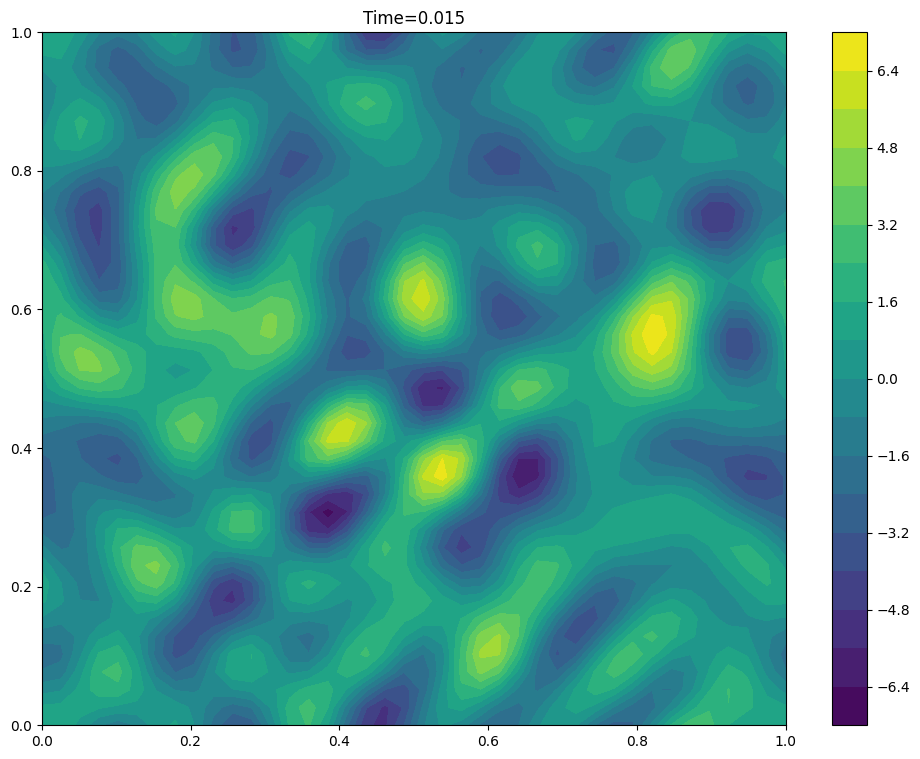

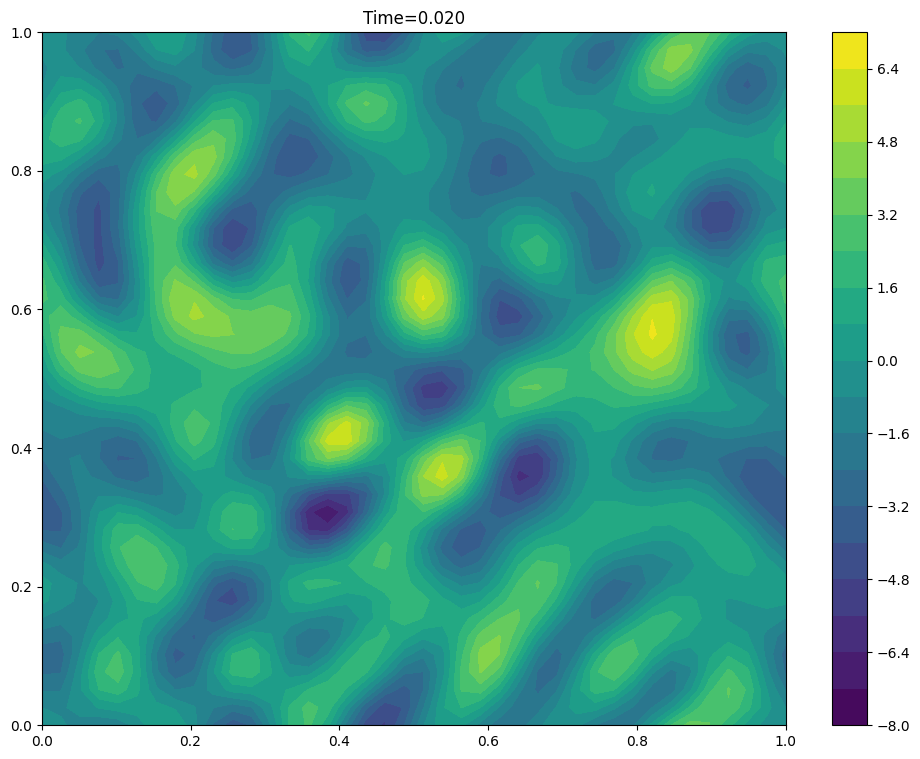

...

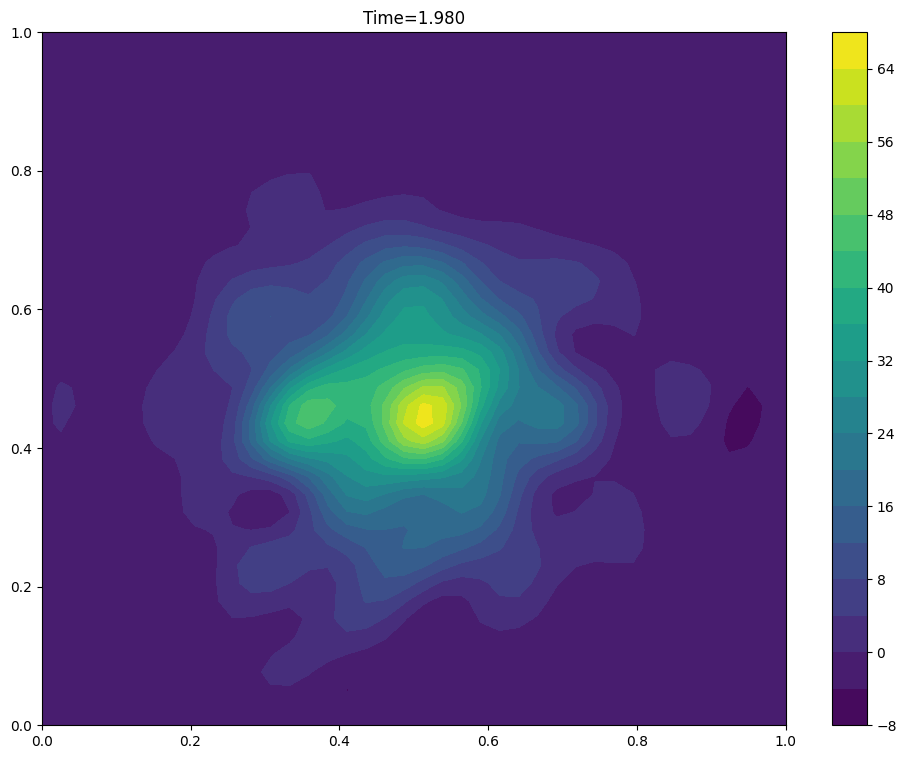

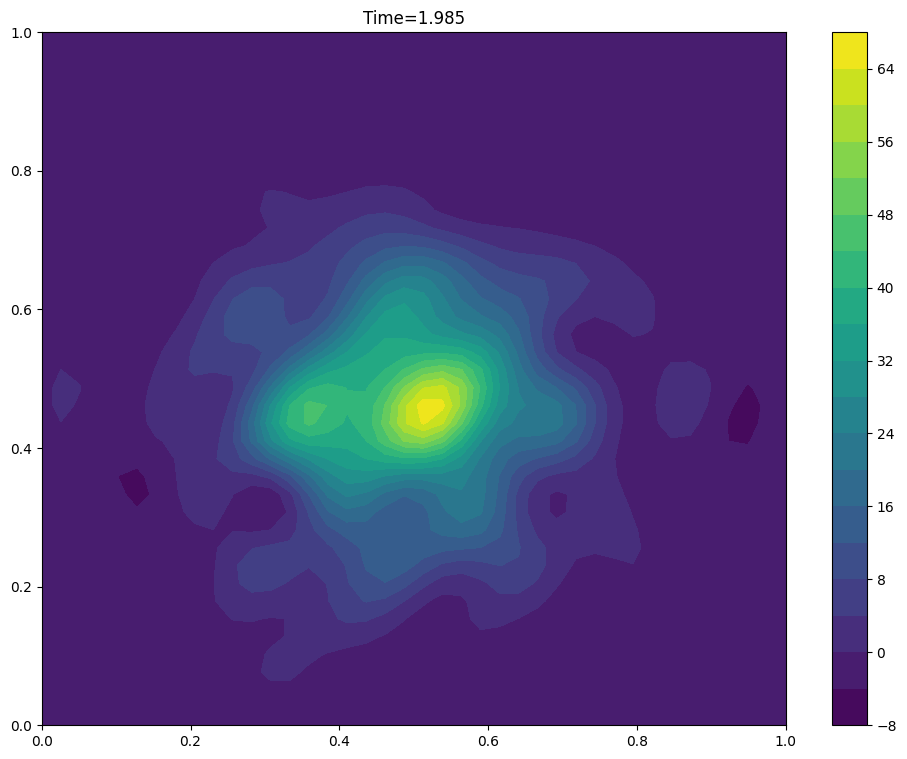

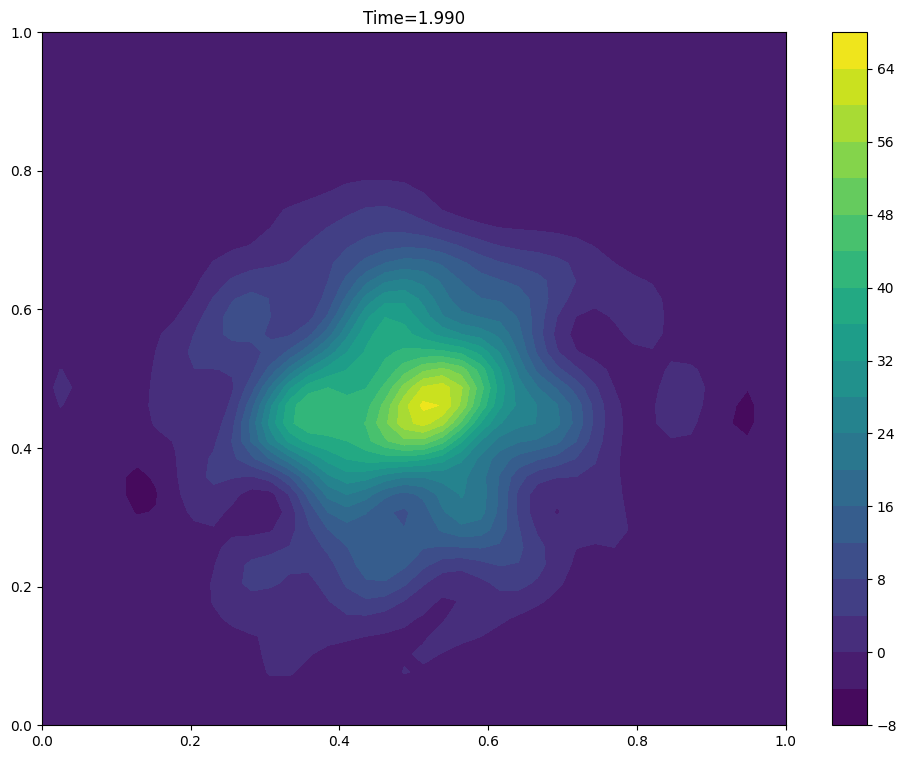

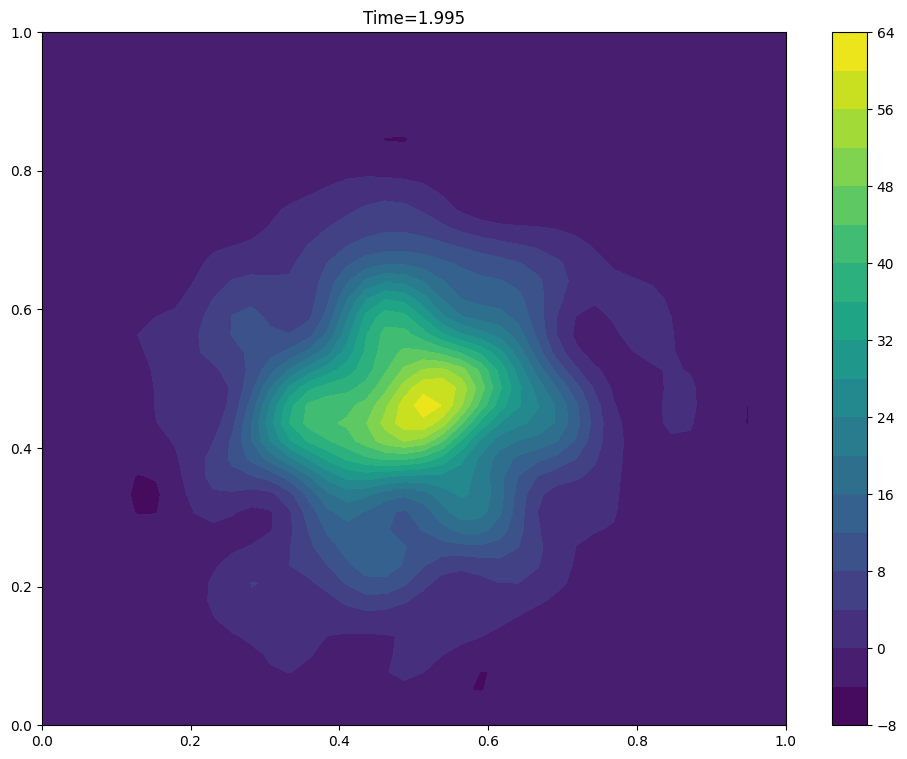

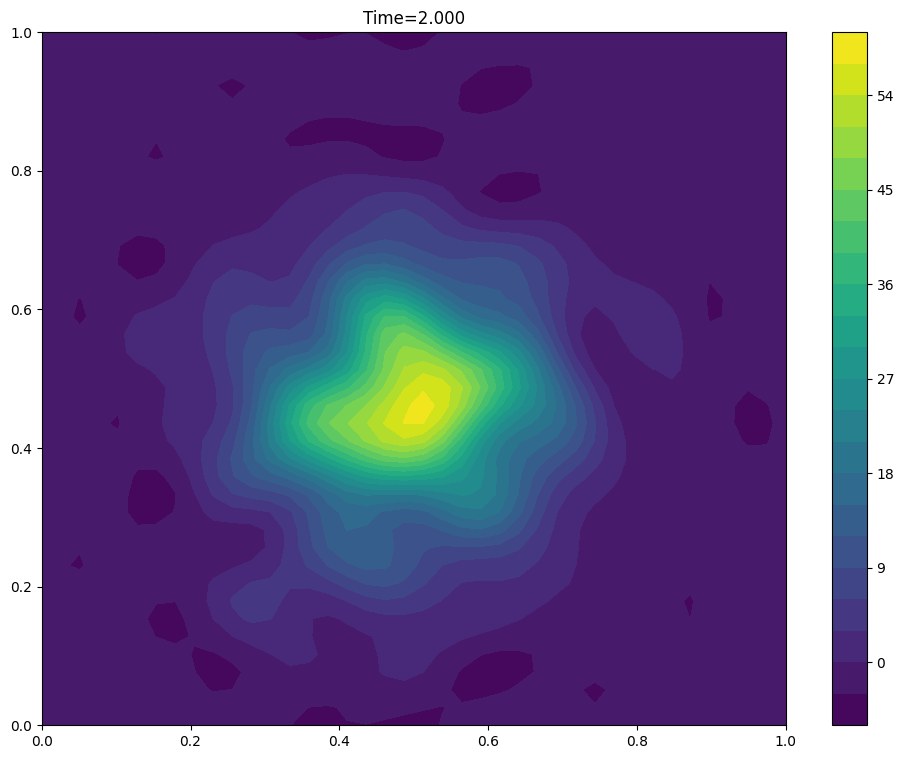

In [10]:
dr = (rmax-rmin)/(40-1)
rr = np.arange(rmin, rmax+0.1*dr, dr)
xv, yv = np.meshgrid(rr, rr)
cnt = 0
levs = np.arange(-0.8, 0.8001, 0.004)
for v in times:
    cc = plt.contourf(xv, yv, surfaces[v]['dens'].transpose(), 20)
    plt.colorbar(cc)
    plt.title('Time={:4.3f}'.format(v))
    plt.savefig('cube_{:04d}.png'.format(cnt))
    cnt += 1
    plt.show()